# Script to cluster and phenotype our PDAC Data

In [1]:
import pandas as pd
from phenograph.cluster import cluster
import glob
from pathlib import Path
from tqdm import tqdm
import json
import numpy as np
import os, random
from scipy.stats import zscore

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
plt.style.use("ggplot")

os.environ["PYTHONHASHSEED"] = "0"
random.seed(10)
np.random.seed(10)

In [43]:
test = pd.read_parquet('./arcsinh/phenograph_clustering/phenograph_clustering.parquet')

In [44]:
test.columns

Index(['Object', '89Y-Collagen-I', '142Nd-CA9', '143Nd-Vimentin', '144Nd-CD14',
       '145Nd-CD31', '146Nd-CD11b', '147Sm-CD163', '148Nd-Pan-Keratin',
       '149Sm-CD15', '150Nd-CD274', '151Eu-LYVE1', '153Eu-CD16', '154Sm-CD11c',
       '155Gd-FoxP3', '156Gd-CD4', '158Gd-E-Cadherin', '159Tb-CD68',
       '160Gd-FAP', '161Dy-CD20', '162Dy-CD8a', '163Dy-CD206', '164Dy-KRT17',
       '166Er-CD74', '167Er-Granzyme_B', '168Er-Ki-67', '169Tm-FOLR2',
       '170Er-CD3', '171Yb-MS4A4A', '172Yb-S100A2', '173Yb-CD45RO',
       '174Yb-Keratin_8_18', '176Yb-Histone_H3', '191Ir-DNA1', '193Ir-DNA2',
       '195Pt-ICSK1', '196Pt-ICSK2', '198Pt-ICSK3', '209Bi-aSMA', 'patient',
       'sample', 'location', 'Cluster'],
      dtype='object')

In [47]:
folder_directory = "./arcsinh/Steinbock/"
morphology_path = Path('./arcsinh/Steinbock/regionprops')

folder_saving = Path(folder_directory) / "Figures"
folder_saving.mkdir(exist_ok=True)

WHOLE_SAMPLE = True
LOAD_DATA = False


RUN_PHENOGRAPH = not LOAD_DATA
clustering_min_neighbors = 90

In [58]:
data.keys()

dict_keys(['markers', 'identity_markers', 'functional_markers', 'segmentation_markers'])

In [98]:
print(df["Cluster"].value_counts().describe())

count      134.000000
mean      4055.947761
std       3800.527063
min        319.000000
25%       1556.750000
50%       2309.500000
75%       5695.250000
max      17031.000000
Name: count, dtype: float64


In [48]:
folder_directory = Path(folder_directory)
marker_directory = folder_directory / "intensities"
info_path = Path(folder_directory) / "informations.json"
files = sorted(list(marker_directory.glob("*")))

with open(info_path) as f:
    data = json.load(f)

functional_markers = data["functional_markers"]
identity_markers = data["identity_markers"]
segmentation_markers = data["segmentation_markers"]

no_markers_cols = ["Object"]
all_markers = data["markers"]

assert set(identity_markers + functional_markers + segmentation_markers) == set(all_markers)

metainfo = pd.read_csv(folder_directory / "images_metadatainfo.csv")

Mapping of those location

In [49]:
LOAD_DATA = False

intermediate_folder = Path('./arcsinh/phenograph_clustering')
intermediate_folder.mkdir(parents=True, exist_ok=True)
if LOAD_DATA:
    df = pd.read_parquet(intermediate_folder / 'phenograph_clustering.parquet')

## Pre processing

In [50]:
mapping_location = {
    'tumour': 'Tumour',
    'tumour centre': 'Tumour',
    'tumour_invasive area': 'Tumour',
    'tumour + islets': 'Tumour',
    'tumour incl. stroma and islets': 'Tumour',
    'tumor intraductal spread': 'Tumour',

    'tumour stroma': 'Tumour_troma',
    'adjacent stroma': 'Tumour_troma',

    'dysplasia': 'Dysplasia',
    'dysplasia + islets': 'Dysplasia',

    'adjacent normal': 'Adjacent_normal'
}



metainfo['Notes'] = metainfo["Notes"].map(mapping_location)
metainfo = metainfo.set_index("image")

In [51]:
metainfo['Notes']

image
hPDAC_0103          Dysplasia
hPDAC_0104    Adjacent_normal
hPDAC_0102       Tumour_troma
hPDAC_0101             Tumour
hPDAC_0203       Tumour_troma
hPDAC_0204       Tumour_troma
hPDAC_0201             Tumour
hPDAC_0202             Tumour
hPDAC_0303             Tumour
hPDAC_0301             Tumour
hPDAC_0302             Tumour
hPDAC_0404          Dysplasia
hPDAC_0405    Adjacent_normal
hPDAC_0403       Tumour_troma
hPDAC_0402             Tumour
hPDAC_0401             Tumour
hPDAC_0503          Dysplasia
hPDAC_0504    Adjacent_normal
hPDAC_0502       Tumour_troma
hPDAC_0501             Tumour
hPDAC_0604          Dysplasia
hPDAC_0603       Tumour_troma
hPDAC_0601             Tumour
hPDAC_0602             Tumour
hPDAC_0704    Adjacent_normal
hPDAC_0703       Tumour_troma
hPDAC_0701             Tumour
hPDAC_0702             Tumour
hPDAC_0804    Adjacent_normal
hPDAC_0803       Tumour_troma
hPDAC_0801             Tumour
hPDAC_0802             Tumour
hPDAC_0904          Dysplasia
hPDA

In [52]:
if not LOAD_DATA:
    if WHOLE_SAMPLE:
        df = pd.DataFrame()
        cell_total = 0
        hash = 0

        for file in tqdm(files, desc="[PROCESS] Concat each sample"):
            df_file = pd.read_csv(file)
            name = file.name.split('_')[1]
            df_file['patient'] = name[0:2]
            df_file['sample'] = name[2:4]
            df_file['location'] = metainfo['Notes'].loc[file.name.split('.')[0]]
            df_file['Object'] = df_file['Object'] + hash
            df = pd.concat([df, df_file], ignore_index=True)
            cell_total += len(df_file)
            hash += len(df_file)


    no_markers_cols = no_markers_cols + ['patient', 'sample', 'location']

[PROCESS] Concat each sample: 100%|██████████| 43/43 [00:02<00:00, 16.33it/s]


Separation des cellules par ROI

In [53]:
if not LOAD_DATA:
    df_verification = df.drop(columns = no_markers_cols + segmentation_markers + functional_markers)

In [54]:
if not LOAD_DATA:
    mask_zero_cells = (df_verification == 0.0).all(axis=1)

    df = df.loc[~mask_zero_cells].copy()

    nb_cellules_invisibles = mask_zero_cells.sum()
    proportion_non_trouvee = nb_cellules_invisibles / len(df_verification)
    print(f"Proportion de cellule non trouvé par des markers : {proportion_non_trouvee}\n")
    print(f"Nombre de cellules invisible pour les markers d'identité : {nb_cellules_invisibles}")

Proportion de cellule non trouvé par des markers : 0.011769732894521519

Nombre de cellules invisible pour les markers d'identité : 6473


## Clustering

### Functions

In [55]:
def normalize_marker_values(df, no_marker_cols):
    """
    This function normalizes each column based on the 99.9% percentile

    Parameters
    ----------
    df  :   dataframe
        dataframe with cells on y-axis and markers on x-axis
    no_marker_cols  :   list
        columns that do not contain marker values and need to be excluded

    Returns
    -------
    df  :   dataframe
        modified dataframe with normalized marker columns
    """

    numeric_cols = df.select_dtypes(include=['number']).columns.tolist()

    cols_to_normalize = [col for col in numeric_cols if col not in no_marker_cols]

    for col in cols_to_normalize:
        p99_9 = df[col].quantile(0.999)
        df[col] = df[col].clip(upper=p99_9)
        df[col] = (df[col] - df[col].min()) / (p99_9 - df[col].min())

    return df

def normalize_arcsinh(df, no_marker_cols, c=1):
    numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
    cols_to_normalize = [col for col in numeric_cols if col not in no_marker_cols]

    df[cols_to_normalize] = np.arcsinh(df[cols_to_normalize] / c)
    return df

def clip_marker_values(df, no_marker_cols, upper=1):
    """
    Cette fonction applique un clipping uniquement sur les colonnes
    correspondant aux marqueurs.
    """

    df_clip = df.copy()

    numeric_cols = df_clip.select_dtypes(include=["number"]).columns
    cols_to_clip = [col for col in numeric_cols if col not in no_marker_cols]

    df_clip[cols_to_clip] = df_clip[cols_to_clip].clip(upper=upper)

    return df_clip

def get_phenograph(df, no_marker_cols, functional_markers, segmentation_markers, identity_markers, k_neighbors = 30):
    """
    Executes clustering of markers using the PhenoGraph package

    Parameters
    ----------
    df  :   dataframe
        with cells on y-axis and markers on x-axis
    no_marker_cols  :   list
        columns that do not contain marker values and need to be excluded
    functional_markers  :   list
        list of functional markers, these should be excluded from clustering
    k_neighbors :   integer
        number of knns for clustering, default is 30

    Returns
    -------
    df  :   dataframe
        modified dataframe containing an additional column with cluster identification
    """

    # Exclude columns not needed for clustering
    columns_to_drop = no_marker_cols + functional_markers + segmentation_markers
    existing_columns_to_drop = [col for col in columns_to_drop if col in df.columns]
    data_for_clustering = df.drop(columns=existing_columns_to_drop)
    assert set(data_for_clustering.columns) == set(identity_markers)
    # Use clustering method from phenograph package to construct phenograph
    communities, graph, Q = cluster(data_for_clustering, 
                                    k = k_neighbors,                      
                                    primary_metric = 'minkowski',         
                                    seed = 10,                           
                                    n_jobs = -1)

    # Add the cluster assignments back to the original DataFrame
    df['Cluster'] = communities
    df['Cluster'] = communities.astype(int)
    tqdm.write(f"Quality of Clustering : {Q}")
    
    return df

### Clustering by Phenograh

In [59]:
if not LOAD_DATA:
    if isinstance(no_markers_cols, str):
        no_markers_cols = list(no_markers_cols)

In [60]:
if not LOAD_DATA:
    if WHOLE_SAMPLE and RUN_PHENOGRAPH:
        tqdm.write('[INFO] PHENOGRAPH PROCESSING ...')
        df = normalize_arcsinh(df, no_markers_cols, c=1)
        df = normalize_marker_values(df, no_markers_cols)
        df = clip_marker_values(df, no_markers_cols, upper=1)
        df = get_phenograph(df, no_markers_cols, functional_markers, segmentation_markers, identity_markers, 
                                k_neighbors=clustering_min_neighbors)

    elif not WHOLE_SAMPLE and RUN_PHENOGRAPH:
        dataset = {}
        cell_total = 0
        for file in tqdm(files, desc="Clustering by Phenograph for each sample"):
            df = pd.read_csv(file)
            df = normalize_arcsinh(df, no_markers_cols)
            df = normalize_marker_values(df, no_markers_cols)                   # Normalisation by 99 percentile
            df = clip_marker_values(df, no_markers_cols, upper=1)
            df = get_phenograph(df, no_markers_cols, functional_markers, segmentation_markers, identity_markers, 
                                k_neighbors=clustering_min_neighbors)
            cell_total += len(df)
            dataset[file.name] = df

[INFO] PHENOGRAPH PROCESSING ...
Finding 90 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 31.309303522109985 seconds
Jaccard graph constructed in 304.82599401474 seconds
Wrote graph to binary file in 10.8715078830719 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.974922
Louvain completed 21 runs in 1055.5981948375702 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 1409.7790727615356 seconds
Quality of Clustering : 0.974922


Number of cluster that we want after the hierarchical clustering

How much cells we have per clusters

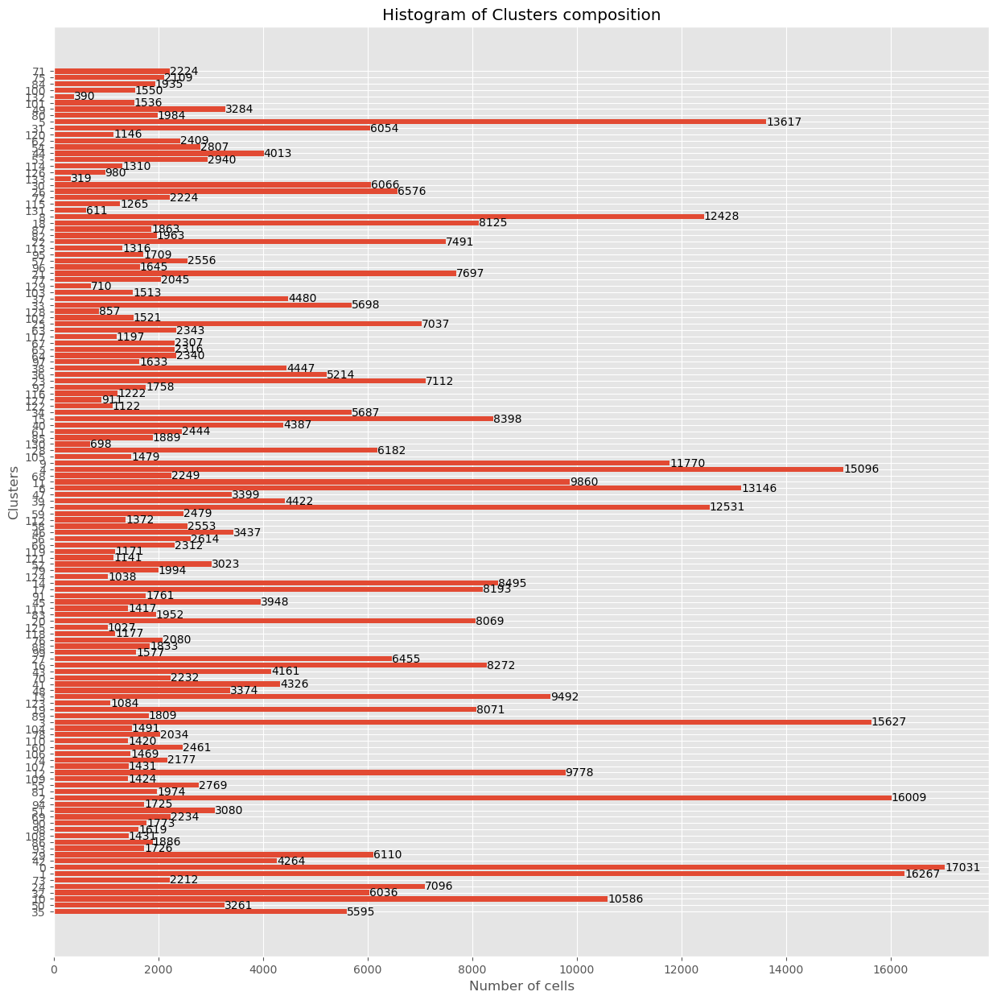

In [61]:
if not LOAD_DATA:
    unique_celltypes = df["Cluster"].unique()
    celltype_counts = {}

    for unique_celltype in unique_celltypes:
        count = df[df["Cluster"] == unique_celltype].shape[0]
        celltype_counts[unique_celltype] = count
    celltype_counts_str = {str(key): value for key, value in celltype_counts.items()}


    plt.figure(figsize=(15, 15))

    bars = plt.barh(celltype_counts_str.keys(), celltype_counts_str.values())

    for bar in bars:
        xval = bar.get_width()
        plt.text(xval, bar.get_y() + bar.get_height()/2,
                int(xval),
                va='center', ha='left')

    plt.xlabel('Number of cells')
    plt.ylabel('Clusters')
    plt.title('Histogram of Clusters composition')
    plt.xticks(rotation=0)
    plt.show()

Maybe we could reduce the number of cluster by using hierarchical clustering

But first we need to :
- Compute mean for each markers group by cluster
- Understand which markers describe the best each clusters
- Do the same after a hierchical clustering

### Creation of table of mean intensities to plot heatmap

In [62]:
if not LOAD_DATA:
    nb_reduced_cluster = 17

    df_intensities = df.drop(columns= no_markers_cols + functional_markers + segmentation_markers)

    median_intensities = df_intensities.groupby('Cluster').median()
    mean_intensities = df_intensities.groupby('Cluster').mean()
    mean_intensities.head()

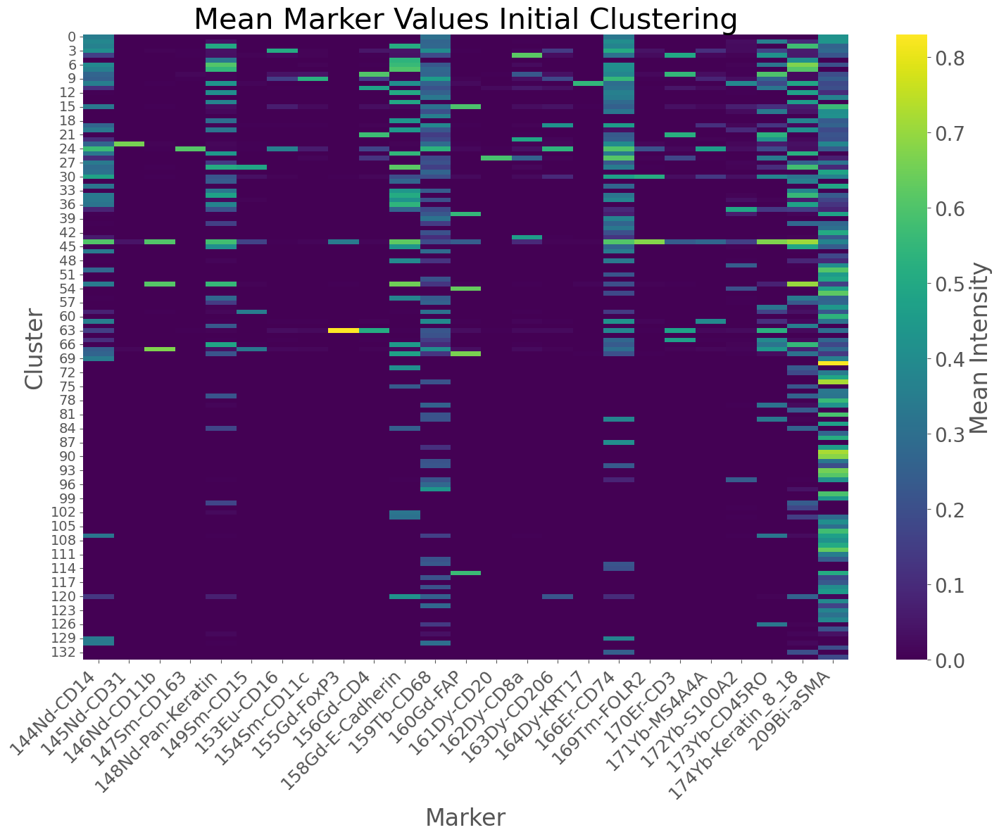

In [63]:
if not LOAD_DATA:
    plt.figure(figsize=(15, 12))

    heatmap = sns.heatmap(mean_intensities, annot=False, cmap='viridis')

    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)
    cbar.set_label("Mean Intensity", fontsize=24)

    plt.title("Mean Marker Values Initial Clustering", fontsize=30)
    plt.xlabel("Marker", fontsize=24)
    plt.ylabel("Cluster", fontsize=24)
    plt.xticks(rotation=45, fontsize=18, ha='right')
    plt.yticks(fontsize=14)
    plt.tight_layout()
    plt.savefig(folder_saving / "heatmap_marker_phenograph_clustering.png", dpi=300, bbox_inches="tight")

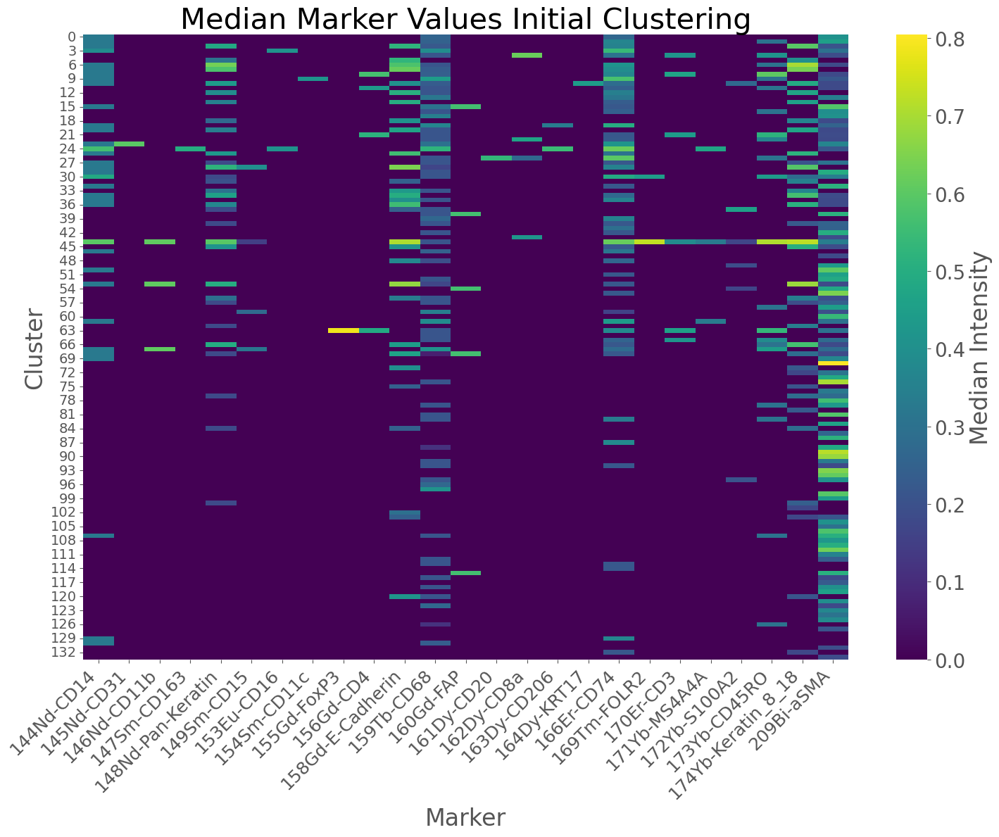

In [64]:
if not LOAD_DATA:
    plt.figure(figsize=(15, 12))

    heatmap = sns.heatmap(median_intensities, annot=False, cmap='viridis')

    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)
    cbar.set_label("Median Intensity", fontsize=24)

    plt.title("Median Marker Values Initial Clustering", fontsize=30)
    plt.xlabel("Marker", fontsize=24)
    plt.ylabel("Cluster", fontsize=24)
    plt.xticks(rotation=45, fontsize=18, ha='right')
    plt.yticks(fontsize=14)
    plt.tight_layout()
    plt.savefig(folder_saving / "heatmap_marker_phenograph_clustering.png", dpi=300, bbox_inches="tight")

In [65]:
if not LOAD_DATA:
    df_used_to_phenotype = median_intensities
    stat_name = 'median'

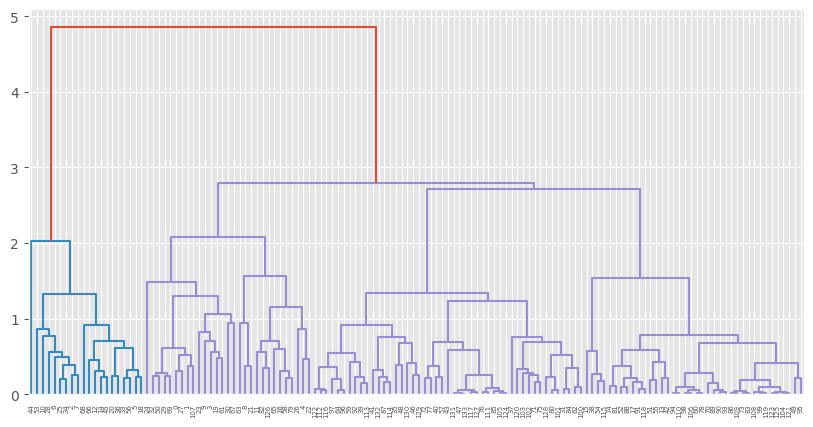

In [71]:
from scipy.cluster.hierarchy import dendrogram

plt.figure(figsize=(10,5))
dendrogram(Z)
plt.show()

In [76]:
mapping = dict(zip(df_used_to_phenotype.index, cluster_assignments))
print(len(mapping))

134


In [79]:
for n in [2,3,5,10,20,30]:
    c = fcluster(Z, t=n, criterion="maxclust")
    print(n, np.unique(c).size)

2 2
3 3
5 5
10 10
20 20
30 30


In [77]:
print(df_used_to_phenotype.shape)
print(len(np.unique(cluster_assignments)))
print(np.unique(cluster_assignments))

(134, 25)
17
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


In [82]:
print(df_used_to_phenotype.index.tolist()[:20])
print(sorted(df["Cluster"].unique())[:20])

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
[np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19)]


In [107]:
nb_reduced_cluster = None

nb_reduced_cluster = 15
New clusters : 15
Heatmap shape : (15, 25)


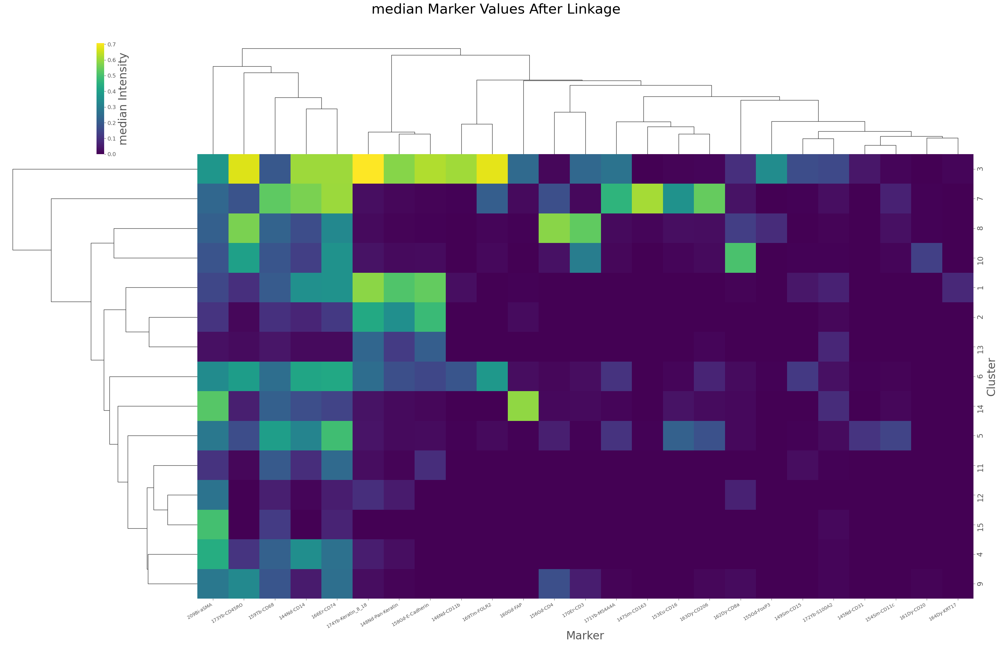

In [108]:
if not LOAD_DATA:
    from scipy.cluster.hierarchy import linkage, fcluster
    import matplotlib.pyplot as plt
    from mosna import mosna

    df_reassigned = df.copy()

    Z = linkage(df_used_to_phenotype, method="ward")

    if nb_reduced_cluster is None:
        nb_reduced_cluster = 15

    cluster_assignments = fcluster(Z, t=nb_reduced_cluster, criterion="maxclust")

    mapping = dict(zip(df_used_to_phenotype.index, cluster_assignments))

    df_reassigned = df_reassigned.drop(columns=["Object", "sample", "patient"] + functional_markers + segmentation_markers, errors="ignore")
    df_reassigned["New_Cluster"] = df_reassigned["Cluster"].map(mapping)

    if df_reassigned["New_Cluster"].isna().any():
        missing = df_reassigned.loc[df_reassigned["New_Cluster"].isna(), "Cluster"].unique()
        raise ValueError(f"Clusters non mappés (problème d'index/labels) : {missing}")

    df_reassigned = df_reassigned.drop(columns=["Cluster"], errors="ignore")

    mean_expression_reassigned = (
        df_reassigned.groupby("New_Cluster", as_index=False)
        .mean(numeric_only=True)
    )
    mean_expression_reassigned = mean_expression_reassigned.set_index("New_Cluster")

    print("nb_reduced_cluster =", nb_reduced_cluster)
    print("New clusters :", df_reassigned["New_Cluster"].nunique())
    print("Heatmap shape :", mean_expression_reassigned.shape)
    heatmap = mosna.plot_heatmap(
        mean_expression_reassigned,
        z_score=None,
        cmap="viridis",
        figsize=(30, 20)
    )

    heatmap.fig.suptitle(f"{stat_name} Marker Values After Linkage", fontsize=30)
    heatmap.fig.subplots_adjust(top=0.92)

    colorbar_ax = [
        ax for ax in heatmap.fig.axes
        if ax not in [heatmap.ax_heatmap, heatmap.ax_row_dendrogram, heatmap.ax_col_dendrogram]
    ][0]
    colorbar_ax.set_aspect(20)
    colorbar_ax.yaxis.label.set_size(18)
    colorbar_ax.yaxis.set_tick_params(labelsize=12)
    colorbar_ax.set_ylabel(f"{stat_name} Intensity", fontsize=24)
    #colorbar_ax.set_position([.98, 0.137, 0.2, 0.65])

    heatmap.ax_heatmap.set_ylabel("Cluster", fontsize=24)
    heatmap.ax_heatmap.set_xlabel("Marker", fontsize=24)

    for label in heatmap.ax_heatmap.get_xticklabels():
        label.set_fontsize(10)
    for label in heatmap.ax_heatmap.get_yticklabels():
        label.set_fontsize(16)

    heatmap.ax_row_dendrogram.collections[0].set_linewidth(1)
    heatmap.ax_col_dendrogram.collections[0].set_linewidth(1)

    #plt.tight_layout()
    plt.savefig(folder_saving / "heatmap_hierarchical_clustering_markers.png", dpi=300, bbox_inches="tight")
    plt.show()

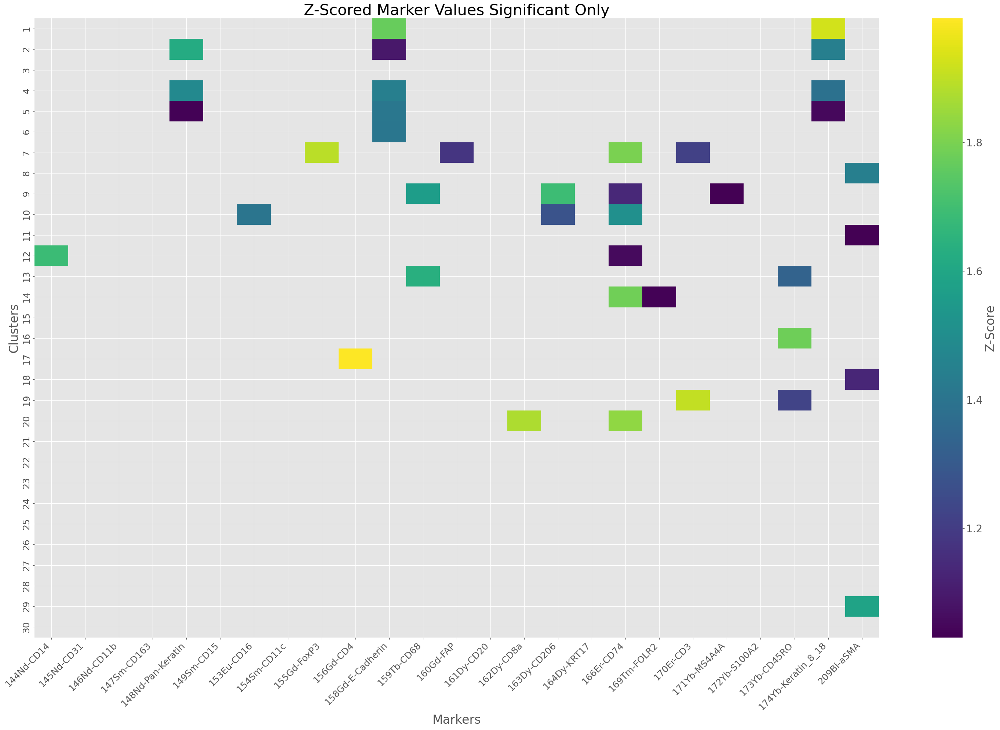

In [102]:
if not LOAD_DATA:
    threshold_min = 1.0
    threshold_max = 2.0

    mean_expression_reassigned = mean_expression_reassigned.apply(lambda col: zscore(col, nan_policy="omit"), axis=0)
    mask = ~(
        (mean_expression_reassigned >= threshold_min) &
        (mean_expression_reassigned <= threshold_max)
    )


    plt.figure(figsize=(30, 20))

    heatmap = sns.heatmap(mean_expression_reassigned, mask=mask, annot=False, cmap='viridis', cbar_kws={'label': 'Z-score'})

    plt.set_cmap("gray")

    plt.xlabel('Markers')
    plt.ylabel('Clusters')

    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)
    cbar.set_label('Z-Score', fontsize=24)

    plt.title("Z-Scored Marker Values Significant Only", fontsize=30)
    plt.xlabel('Markers', fontsize=24)
    plt.ylabel('Clusters', fontsize=24)
    plt.xticks(rotation=45, fontsize=18, ha='right')
    plt.yticks(fontsize=18)
    plt.tight_layout()
    plt.savefig(folder_saving / "Zscore_heatmap_significant_markers_clusters.png", dpi=300, bbox_inches="tight")
    plt.show()

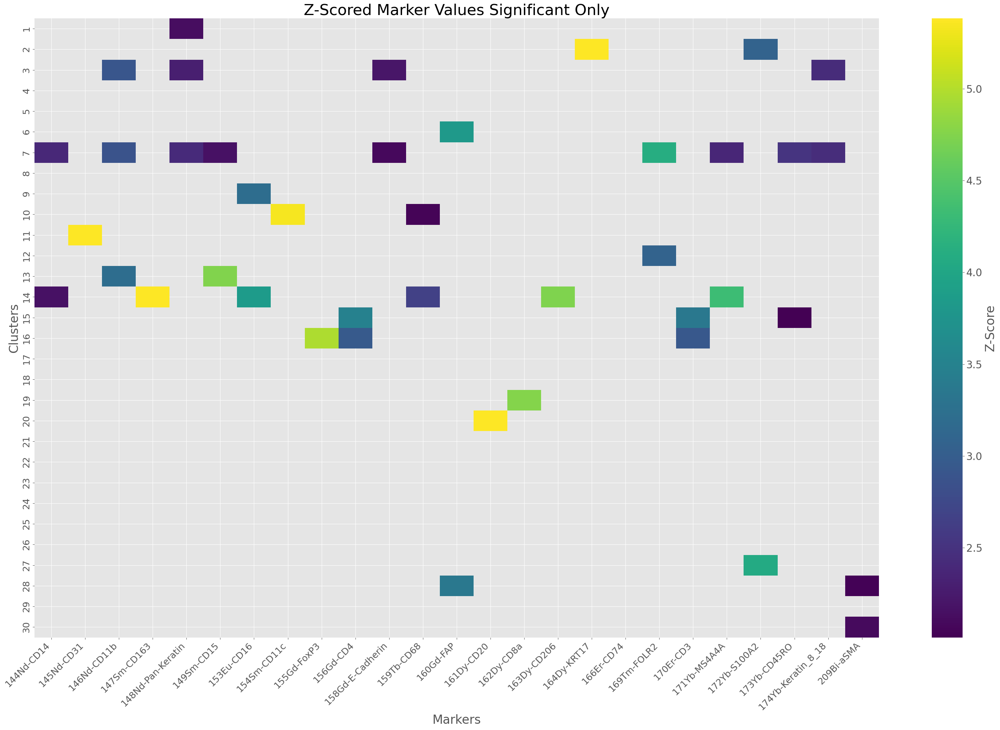

In [103]:
if not LOAD_DATA:
    threshold = 2.0

    mask = mean_expression_reassigned < threshold

    plt.figure(figsize=(30, 20))

    heatmap = sns.heatmap(mean_expression_reassigned, mask=mask, annot=False, cmap='viridis', cbar_kws={'label': 'Z-score'})

    plt.set_cmap("gray")

    plt.xlabel('Markers')
    plt.ylabel('Clusters')

    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=20)
    cbar.set_label('Z-Score', fontsize=24)

    plt.title("Z-Scored Marker Values Significant Only", fontsize=30)
    plt.xlabel('Markers', fontsize=24)
    plt.ylabel('Clusters', fontsize=24)
    plt.xticks(rotation=45, fontsize=18, ha='right')
    plt.yticks(fontsize=18)
    plt.tight_layout()
    plt.savefig(folder_saving / "Zscore_heatmap_significant_markers_clusters.png", dpi=300, bbox_inches="tight")
    plt.show()

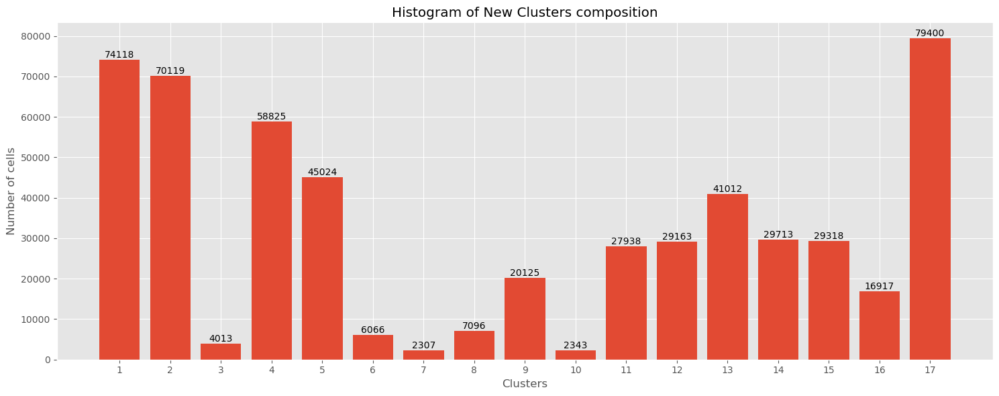

In [69]:
if not LOAD_DATA:    
    unique_celltypes = df_reassigned["New_Cluster"].unique()
    celltype_counts = {}

    for unique_celltype in unique_celltypes:
        count = df_reassigned[df_reassigned["New_Cluster"] == unique_celltype].shape[0]
        celltype_counts[unique_celltype] = count

    celltype_counts = dict(sorted(celltype_counts.items(), key=lambda x: int(x[0])))

    celltype_counts_str = {str(key): value for key, value in celltype_counts.items()}



    plt.figure(figsize=(15, 6))
    bars = plt.bar(celltype_counts_str.keys(), celltype_counts_str.values())
    for bar in bars:
        yval = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            yval,
            int(yval),
            ha='center',
            va='bottom'
        )
    plt.ylabel('Number of cells')
    plt.xlabel('Clusters')
    plt.title('Histogram of New Clusters composition')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.savefig(folder_saving / "Histogramme_nb_cells_cluster.png", dpi=300, bbox_inches="tight")
    plt.show()

In [70]:
df_final = df.copy()
if not LOAD_DATA:
    df_final = df.copy()
    df_final["Cluster"] = df["Cluster"].map(mapping)
    df_final.to_parquet(intermediate_folder / 'phenograph_clustering.parquet')
df_final

,Object,89Y-Collagen-I,142Nd-CA9,143Nd-Vimentin,144Nd-CD14,145Nd-CD31,146Nd-CD11b,147Sm-CD163,148Nd-Pan-Keratin,149Sm-CD15,...,191Ir-DNA1,193Ir-DNA2,195Pt-ICSK1,196Pt-ICSK2,198Pt-ICSK3,209Bi-aSMA,patient,sample,location,Cluster
0,1,0.000000,0.512935,0.469166,0.604659,0.0,0.0,0.0,0.234568,0.0,...,0.287764,0.332023,0.809693,0.898508,0.929291,0.282986,01,01,Tumour,13
1,2,0.000000,0.000000,0.394231,0.326722,0.0,0.0,0.0,0.000000,0.0,...,0.601680,0.592590,0.000000,0.390792,0.204819,0.547915,01,01,Tumour,4
2,3,0.000000,0.604806,0.327529,0.326722,0.0,0.0,0.0,0.296212,0.0,...,0.743349,0.722920,0.683479,0.737148,0.831909,0.298260,01,01,Tumour,1
3,4,0.000000,0.000000,0.325439,0.326722,0.0,0.0,0.0,0.000000,0.0,...,0.615870,0.658819,0.261867,0.128915,0.240431,0.386499,01,01,Tumour,4
4,5,0.000000,0.000000,0.252747,0.326722,0.0,0.0,0.0,0.000000,0.0,...,0.718885,0.744265,0.000000,0.299683,0.315983,0.571077,01,01,Tumour,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549965,549966,0.542784,0.000000,0.637143,0.536310,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.387543,0.396412,0.201443,0.600898,10,05,Adjacent_normal,4
549966,549967,0.000000,0.000000,0.296143,0.556237,0.0,0.0,0.0,0.000000,0.0,...,0.334725,0.543413,0.261867,0.320074,0.371121,0.480055,10,05,Adjacent_normal,5
549967,549968,0.000000,0.000000,0.294876,0.382632,0.0,0.0,0.0,0.000000,0.0,...,0.418753,0.640538,0.142974,0.505482,0.109984,0.407990,10,05,Adjacent_normal,5
549968,549969,0.000000,0.000000,0.899462,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.292534,0.372621,0.261867,0.000000,0.509622,0.591543,10,05,Adjacent_normal,10


Assignation by using a table of markers

# Mapping and filtering all nodes 

In [39]:
mapping_cluster_to_phenotype = {1:"Tumour_3",
                                2:"Unknown",
                                3:"Tumour_1",
                                4:"Macrophage M2",
                                5:"CAF_1",
                                6:"CAF_2",
                                7:"CAF_4",
                                8:"CAF_3",
                                9:"Tumour_2",
                                10:"Endothelial Cell",
                                11:"Macrophage",
                                12:"Monocyte",
                                13:"CD4 T Cell",
                                14:"Treg cell",
                                15:"B Cell",
                                16:"Unknown",
                                17:"Unknown"}


In [40]:
phenotyped = df_final.copy()
phenotyped['Cluster'] = phenotyped['Cluster'].map(mapping_cluster_to_phenotype)
phenotyped

,Object,89Y-Collagen-I,142Nd-CA9,143Nd-Vimentin,144Nd-CD14,145Nd-CD31,146Nd-CD11b,147Sm-CD163,148Nd-Pan-Keratin,149Sm-CD15,...,191Ir-DNA1,193Ir-DNA2,195Pt-ICSK1,196Pt-ICSK2,198Pt-ICSK3,209Bi-aSMA,patient,sample,location,Cluster
0,1,0.000000,0.512900,0.469091,0.604572,0.0,0.0,0.0,0.234564,0.0,...,0.287759,0.332009,0.809693,0.898504,0.929195,0.282980,01,01,epithelial tumour,Tumour_2
1,2,0.000000,0.000000,0.394168,0.326676,0.0,0.0,0.0,0.000000,0.0,...,0.601669,0.592564,0.000000,0.390790,0.204798,0.547904,01,01,epithelial tumour,CAF_3
2,3,0.000000,0.604764,0.327477,0.326676,0.0,0.0,0.0,0.296207,0.0,...,0.743335,0.722889,0.683479,0.737145,0.831823,0.298254,01,01,epithelial tumour,Tumour_1
3,4,0.000000,0.000000,0.325387,0.326676,0.0,0.0,0.0,0.000000,0.0,...,0.615858,0.658790,0.261867,0.128915,0.240406,0.386491,01,01,epithelial tumour,CAF_3
4,5,0.000000,0.000000,0.252706,0.326676,0.0,0.0,0.0,0.000000,0.0,...,0.718872,0.744233,0.000000,0.299682,0.315951,0.571065,01,01,epithelial tumour,CAF_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549965,549966,0.542522,0.000000,0.637041,0.536233,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.387543,0.396410,0.201422,0.600886,10,05,adjacent normal,CAF_3
549966,549967,0.000000,0.000000,0.296096,0.556158,0.0,0.0,0.0,0.000000,0.0,...,0.334719,0.543389,0.261867,0.320072,0.371082,0.480045,10,05,adjacent normal,Endothelial Cell
549967,549968,0.000000,0.000000,0.294829,0.382577,0.0,0.0,0.0,0.000000,0.0,...,0.418746,0.640510,0.142974,0.505479,0.109972,0.407982,10,05,adjacent normal,Endothelial Cell
549968,549969,0.000000,0.000000,0.899318,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.292529,0.372605,0.261867,0.000000,0.509569,0.591531,10,05,adjacent normal,Treg cell


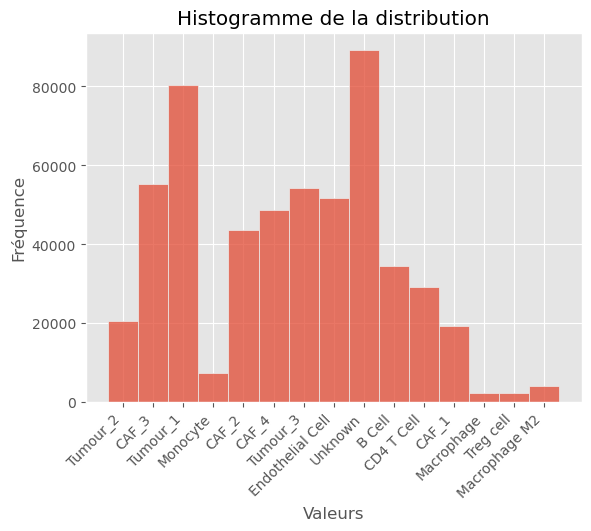

In [41]:
sns.histplot(phenotyped, x='Cluster' ,bins=30)

plt.title("Histogramme de la distribution")
plt.xlabel("Valeurs")
plt.ylabel("Fréquence")
plt.xticks(rotation=45, ha='right')
plt.show()

### Investigate distribution of phenotypes across sample/patient/layers

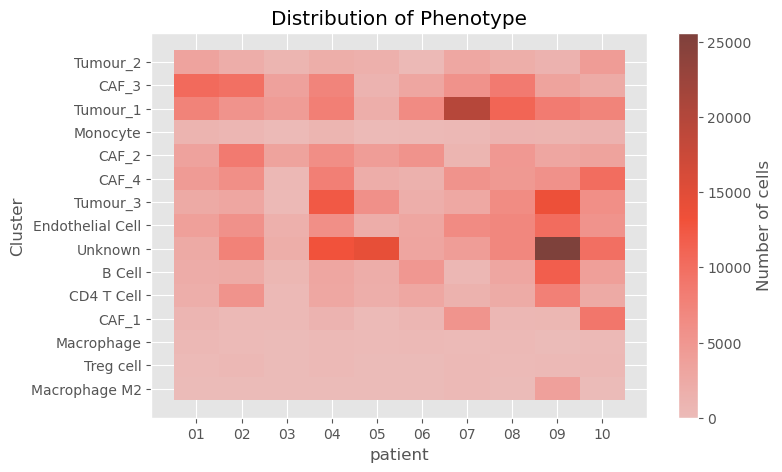

In [42]:
plt.figure(figsize=(8,5))

sns.histplot(
    data=phenotyped,
    x="patient",
    y="Cluster",
    bins=30,
    discrete=(True, True),
    cbar=True,
    cbar_kws={"label": "Number of cells"}
)

plt.title("Distribution of Phenotype")
plt.show()

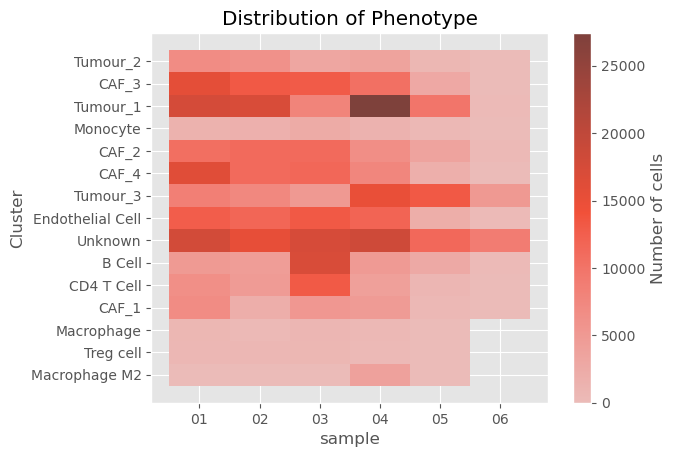

In [43]:
sns.histplot(
    data=phenotyped,
    x="sample",
    y="Cluster",
    bins=30,
    discrete=(True, True),
    cbar=True,
    cbar_kws={"label": "Number of cells"}
)

plt.title("Distribution of Phenotype")
plt.show()

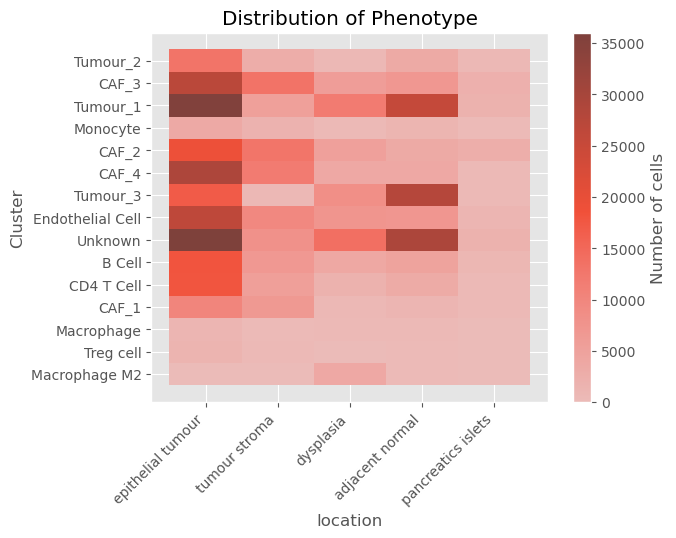

In [44]:
sns.histplot(
    data=phenotyped,
    x="location",
    y="Cluster",
    bins=30,
    discrete=(True, True),
    cbar=True,
    cbar_kws={"label": "Number of cells"}
)
plt.xticks(rotation=45, fontsize=10, ha='right')
plt.title("Distribution of Phenotype")
plt.show()

### Investigate B cell Cluster

Le cluster des B-cells semble exprimé un peu de CD8 T cells

/tmp/ipykernel_19955/4110352658.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=tumour_marker, data=filtered_df, palette=palette)
/tmp/ipykernel_19955/4110352658.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Cluster', y=tumour_marker, data=filtered_df, palette=palette)


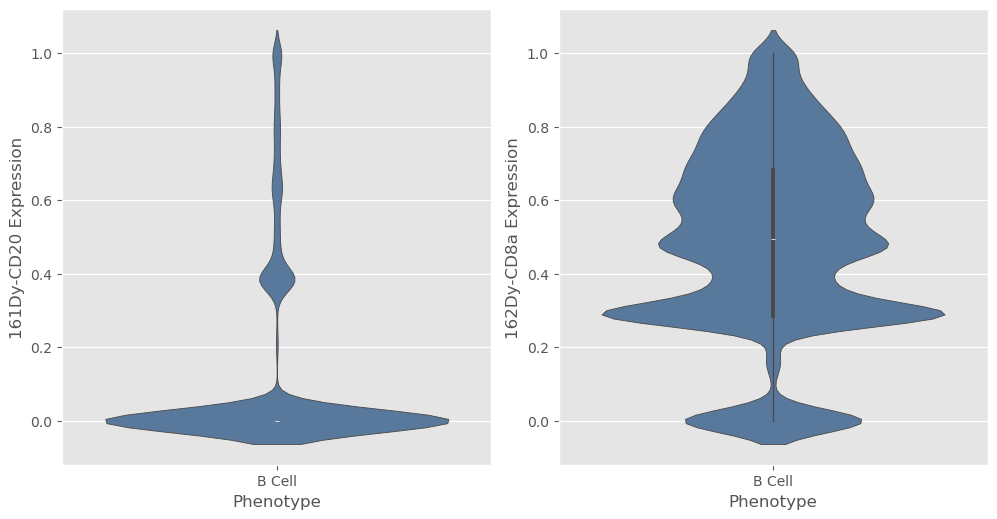

In [45]:
markers_selected = ['161Dy-CD20',
                "162Dy-CD8a"
]

palette = {
    "B Cell": "#4E79A7",
    "Tumour": "#E15759"
}
relevant_clusters = ["B Cell"]
filtered_df = phenotyped[phenotyped['Cluster'].isin(relevant_clusters)]

plt.figure(figsize=(20, 10))
for i, tumour_marker in enumerate(markers_selected, 1):
    plt.subplot(2, 4, i)
    sns.violinplot(x='Cluster', y=tumour_marker, data=filtered_df, palette=palette)
    plt.xlabel('Phenotype')
    plt.ylabel(f'{tumour_marker} Expression')
plt.tight_layout()
plt.show()

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler

marker1 = "161Dy-CD20"
marker2 = "162Dy-CD8a"

def UMAP(df, marker_to_inject):
    X = df[marker_to_inject].fillna(0)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    reducer = umap.UMAP(
        n_neighbors=15,
        min_dist=0.3,
        n_components=2,
        random_state=42
    )
    embedding = reducer.fit_transform(X_scaled)

    filtered_df_umap = df.copy()
    filtered_df_umap["UMAP1"] = embedding[:, 0]
    filtered_df_umap["UMAP2"] = embedding[:, 1]
    return filtered_df_umap

umap_B_cell = UMAP(filtered_df, identity_markers)

/home/mohamed.tahounza/miniconda3/envs/mosna-GUI/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


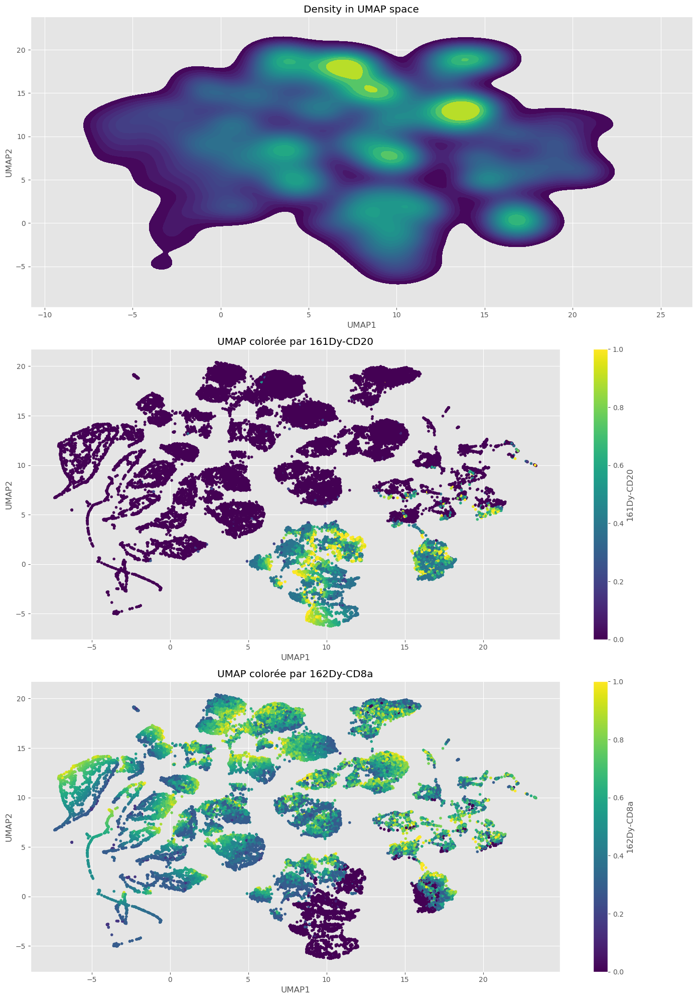

In [47]:
def plot_2_markers(UMAP_df, markers_to_color):
    fig, axes = plt.subplots(3, 1, figsize=(14, 20))

    marker1, marker2 = markers_to_color

    sns.kdeplot(
        data=UMAP_df,
        x="UMAP1",
        y="UMAP2",
        fill=True,
        cmap="viridis",
        levels=30,
        thresh=0.05,
        ax=axes[0]
    )
    axes[0].set_title("Density in UMAP space")
    axes[0].set_xlabel("UMAP1")
    axes[0].set_ylabel("UMAP2")

    sc1 = axes[1].scatter(
        UMAP_df["UMAP1"],
        UMAP_df["UMAP2"],
        c=UMAP_df[marker1],
        s=12
    )
    axes[1].set_title(f"UMAP colorée par {marker1}")
    axes[1].set_xlabel("UMAP1")
    axes[1].set_ylabel("UMAP2")
    plt.colorbar(sc1, ax=axes[1], label=marker1)

    sc2 = axes[2].scatter(
        UMAP_df["UMAP1"],
        UMAP_df["UMAP2"],
        c=UMAP_df[marker2],
        s=12
    )
    axes[2].set_title(f"UMAP colorée par {marker2}")
    axes[2].set_xlabel("UMAP1")
    axes[2].set_ylabel("UMAP2")
    plt.colorbar(sc2, ax=axes[2], label=marker2)

    plt.tight_layout()
    plt.show()

plot_2_markers(umap_B_cell, (marker1, marker2))

#### Re mapping of the B cell cluster

In [48]:
phenotyped = phenotyped.copy()

annotation_col = "Cluster"
marker_b = "161Dy-CD20"
marker_cd8 = "162Dy-CD8a"

# On travaille uniquement sur les cellules déjà annotées B Cell
mask_bcell = phenotyped[annotation_col] == "B Cell"

# Exemple de règle simple :
# si CD8a est élevé et CD20 est faible, on réannote en CD8 T Cell
mask_reassign = (
    mask_bcell &
    (phenotyped[marker_cd8] > 0.2) &
    (phenotyped[marker_b] < 0.2)
)

phenotyped.loc[mask_reassign, annotation_col] = "CD8 T Cell"

### Investigate tumour and macrophage M2 clusters

Le cluster de M2 semble exprimé aussi des cellules tumorales

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler

tumour_markers = ['148Nd-Pan-Keratin',
                "174Yb-Keratin_8_18",
                "164Dy-KRT17",
                "158Gd-E-Cadherin"
]

marker1 = tumour_markers
marker2 = "169Tm-FOLR2"

relevant_clusters = ['Macrophage M2']
filtered_df = phenotyped[phenotyped['Cluster'].isin(relevant_clusters)]


X = filtered_df[identity_markers].fillna(0)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Calcul de l'UMAP
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.3,
    n_components=2,
    random_state=42
)
embedding = reducer.fit_transform(X_scaled)

filtered_df_umap = filtered_df.copy()
filtered_df_umap["UMAP1"] = embedding[:, 0]
filtered_df_umap["UMAP2"] = embedding[:, 1]

/home/mohamed.tahounza/miniconda3/envs/mosna-GUI/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


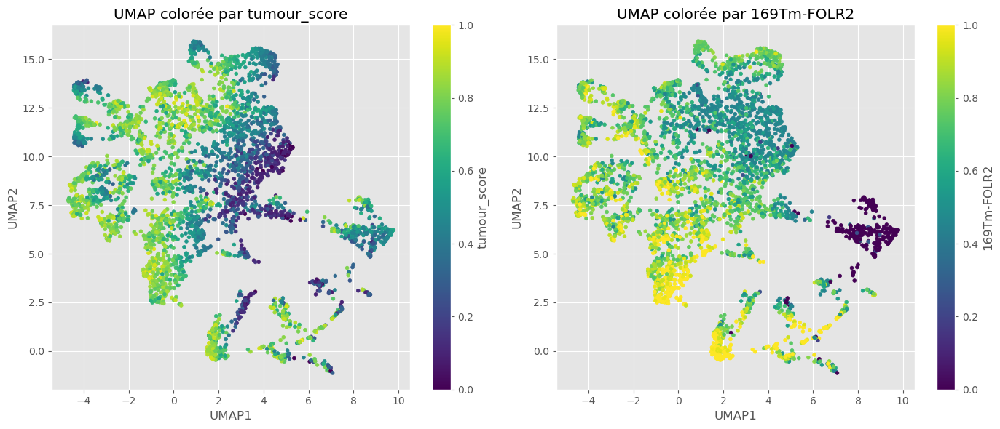

In [50]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
filtered_df_umap["tumour_score"] = filtered_df_umap[tumour_markers].median(axis=1)

sc1 = axes[0].scatter(
    filtered_df_umap["UMAP1"],
    filtered_df_umap["UMAP2"],
    c=filtered_df_umap["tumour_score"],
    s=12
)
axes[0].set_title(f"UMAP colorée par tumour_score")
axes[0].set_xlabel("UMAP1")
axes[0].set_ylabel("UMAP2")
plt.colorbar(sc1, ax=axes[0], label="tumour_score")

sc2 = axes[1].scatter(
    filtered_df_umap["UMAP1"],
    filtered_df_umap["UMAP2"],
    c=filtered_df_umap[marker2],
    s=12
)
axes[1].set_title(f"UMAP colorée par {marker2}")
axes[1].set_xlabel("UMAP1")
axes[1].set_ylabel("UMAP2")
plt.colorbar(sc2, ax=axes[1], label=marker2)

plt.tight_layout()
plt.show()

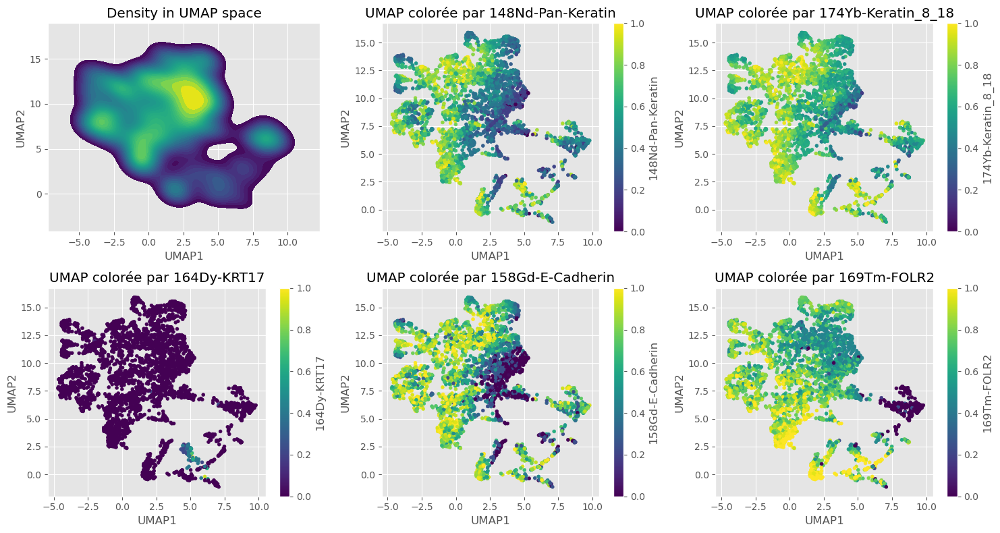

In [51]:
import math

def plot_multiple_markers(umap_df, markers_to_plot):

    n_plots = len(markers_to_plot) + 1
    n_cols = 3
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    axes = axes.flatten()

    sns.kdeplot(
        data=umap_df,
        x="UMAP1",
        y="UMAP2",
        fill=True,
        cmap="viridis",
        levels=30,
        thresh=0.05,
        ax=axes[0]
    )
    axes[0].set_title("Density in UMAP space")
    axes[0].set_xlabel("UMAP1")
    axes[0].set_ylabel("UMAP2")

    for i, marker in enumerate(markers_to_plot):
        sc = axes[i+1].scatter(
            umap_df["UMAP1"],
            umap_df["UMAP2"],
            c=umap_df[marker],
            s=12
        )
        axes[i+1].set_title(f"UMAP colorée par {marker}")
        axes[i+1].set_xlabel("UMAP1")
        axes[i+1].set_ylabel("UMAP2")
        plt.colorbar(sc, ax=axes[i+1], label=marker)

    for j in range(n_plots, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

tumour_markers.append(marker2)
plot_multiple_markers(filtered_df_umap, tumour_markers)

In [52]:
phenotyped = phenotyped.copy()

annotation_col = "Cluster"
marker_M2 = "169Tm-FOLR2"

mask_M2 = phenotyped[annotation_col] == "Macrophage M2"
phenotyped.loc[mask_M2, annotation_col] = "Tumour"

### Investigate Endothelials cells clusters

**Le cluster le plus compliqué a regarder** 

In [53]:
import scanpy as sc
import anndata as ad

relevant_clusters = ['Endothelial Cell']
filtered_df = phenotyped[phenotyped['Cluster'].isin(relevant_clusters)]

X = filtered_df[identity_markers].fillna(0).values
X_scaled = StandardScaler().fit_transform(X)

adata = ad.AnnData(X_scaled)
adata.obs["Cluster"] = filtered_df["Cluster"].values

sc.pp.neighbors(adata, n_neighbors=15, use_rep="X")
sc.tl.leiden(adata, resolution=0.1)
sc.tl.umap(adata)

filtered_df["UMAP1"] = adata.obsm["X_umap"][:, 0]
filtered_df["UMAP2"] = adata.obsm["X_umap"][:, 1]
filtered_df["leiden"] = adata.obs["leiden"].values

/tmp/ipykernel_19955/3164505303.py:14: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.1)
/tmp/ipykernel_19955/3164505303.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["UMAP1"] = adata.obsm["X_umap"][:, 0]
/tmp/ipykernel_19955/3164505303.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#r

In [54]:
tumour_markers = [
    '148Nd-Pan-Keratin',
    '158Gd-E-Cadherin',
    '164Dy-KRT17',
    '172Yb-S100A2',
    '174Yb-Keratin_8_18',
    '143Nd-Vimentin',
    '142Nd-CA9'
]

myeloid_markers = [
    '144Nd-CD14',
    '146Nd-CD11b',
    '147Sm-CD163',
    '149Sm-CD15',
    '153Eu-CD16',
    '154Sm-CD11c',
    '159Tb-CD68',
    '163Dy-CD206',
    '166Er-CD74',
    '169Tm-FOLR2',
    '171Yb-MS4A4A'
]

caf_markers = [
    '160Gd-FAP',
    '209Bi-aSMA'
]

immune_markers= [
    '145Nd-CD31',  
    '155Gd-FoxP3',
    '156Gd-CD4',   
    '161Dy-CD20',    
    '162Dy-CD8a',   
    '170Er-CD3',     
    '173Yb-CD45RO'
]

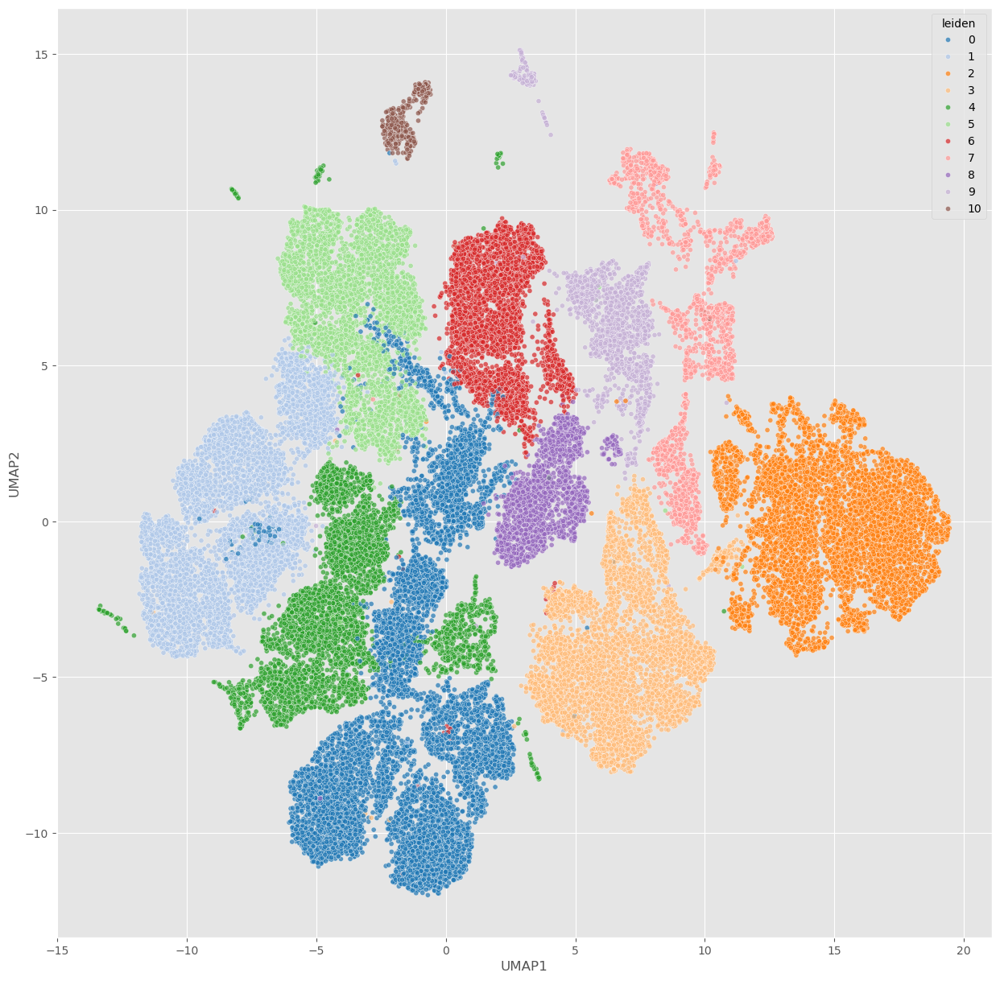

In [55]:
markers_to_color = ["154Sm-CD11c", '145Nd-CD31', "153Eu-CD16", "173Yb-CD45RO", "169Tm-FOLR2", '161Dy-CD20','162Dy-CD8a','156Gd-CD4', '163Dy-CD206','171Yb-MS4A4A','159Tb-CD68']

plt.figure(figsize=(15,15))
sns.scatterplot(
    data=filtered_df,
    x="UMAP1",
    y="UMAP2",
    hue="leiden",
    palette='tab20',
    alpha=0.7,
    s=20
)
plt.show()


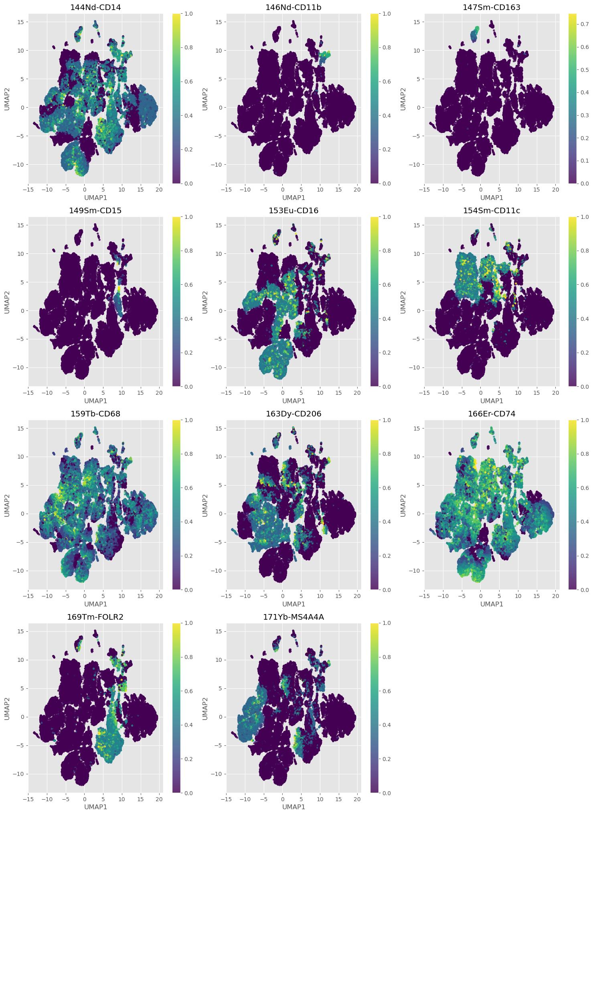

In [56]:
markers_for_umap = myeloid_markers

n_markers = len(markers_for_umap) + 2
n_cols = 3
n_rows = math.ceil(n_markers / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, marker in enumerate(markers_for_umap, 0):
    scat = axes[i].scatter(
        filtered_df["UMAP1"],
        filtered_df["UMAP2"],
        c=filtered_df[marker],
        cmap="viridis",
        s=10,
        alpha=0.8
    )
    
    axes[i].set_title(marker)
    axes[i].set_xlabel("UMAP1")
    axes[i].set_ylabel("UMAP2")
    
    # Barre de couleur pour chaque subplot
    fig.colorbar(scat, ax=axes[i])

# On masque les subplots inutilisés s'il y en a
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

/tmp/ipykernel_19955/976271169.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df["new_annotation"] = filtered_df["leiden"].astype(str).map(mapping_endothelial)


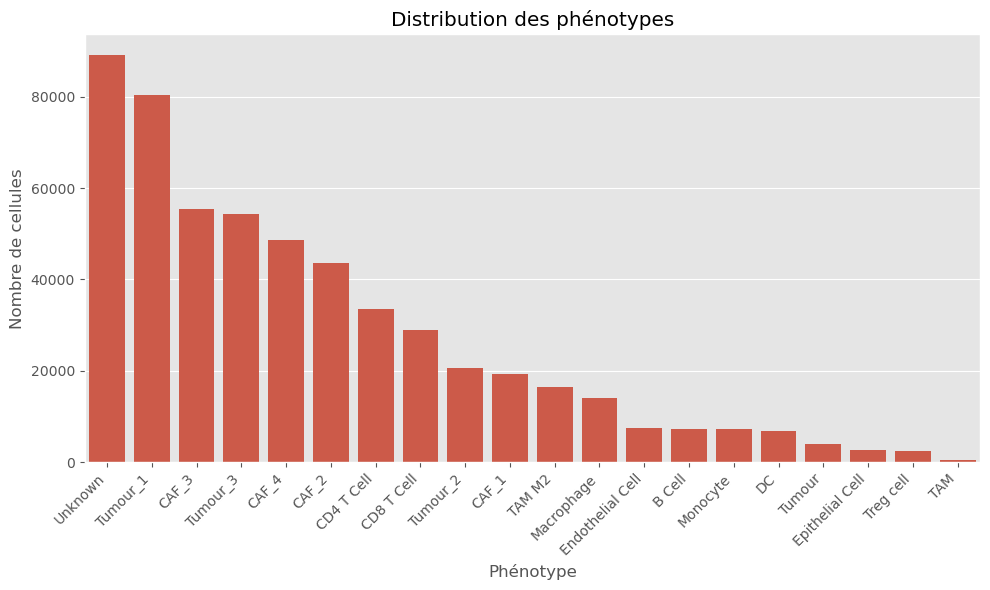

In [57]:
mapping_endothelial_deep = {"0":"Macrophage",
                       "1":"Endothelial Cell",
                       "2":"TAM",
                       "3":"TAM",
                       '4':'resident TAM M2', 
                       '5':'recruted TAM M2',
                       "6":'CD4 T Cell',
                       "7":'Epithelial Cell',
                       "8":"Macrophage",
                       "9":'CD8 T Cell',
                       '10':'TAM',
                       "11":'B Cell',
                       '12':'Tumour'}

mapping_endothelial = {"0":"Macrophage",
                       "1":"Endothelial Cell",
                       "2":"DC",
                       "3":"TAM M2",
                       '4':'TAM M2', 
                       '5':'TAM M2',
                       "6":'CD4 T Cell',
                       "7":'Epithelial Cell',
                       "8":"Macrophage",
                       "9":'CD8 T Cell',
                       '10':'TAM',
                       "11":'B Cell',
                       '12':'Tumour'}

filtered_df["new_annotation"] = filtered_df["leiden"].astype(str).map(mapping_endothelial)
phenotyped.loc[filtered_df.index, "Cluster"] = filtered_df["new_annotation"]

plt.figure(figsize=(10, 6))

sns.countplot(
    data=phenotyped,
    x="Cluster",
    order=phenotyped["Cluster"].value_counts().index
)

plt.xticks(rotation=45, ha='right')
plt.title("Distribution des phénotypes")
plt.xlabel("Phénotype")
plt.ylabel("Nombre de cellules")

plt.tight_layout()
plt.show()

### Investigate Tumour Cluster

Peut etre légèrement des cellules épithéliales

In [58]:
tumour_marker_for_umap = identity_markers + functional_markers

In [59]:
tumour_markers = ['148Nd-Pan-Keratin',
                "174Yb-Keratin_8_18",
                "164Dy-KRT17",
                "158Gd-E-Cadherin",
                "172Yb-S100A2",
                "143Nd-Vimentin",
                "142Nd-CA9"
]

relevant_clusters = ['Tumour','Tumour_1','Tumour_2','Tumour_3']
umap_tumour = phenotyped[phenotyped['Cluster'].isin(relevant_clusters)]

X = umap_tumour[tumour_marker_for_umap].fillna(0).values
X_scaled = StandardScaler().fit_transform(X)

adata = ad.AnnData(X_scaled)
adata.obs["Cluster"] = umap_tumour["Cluster"].values

sc.pp.neighbors(adata, n_neighbors=15, use_rep="X")
sc.tl.leiden(adata, resolution=0.1)
sc.tl.umap(adata)

umap_tumour["UMAP1"] = adata.obsm["X_umap"][:, 0]
umap_tumour["UMAP2"] = adata.obsm["X_umap"][:, 1]
umap_tumour["leiden"] = adata.obs["leiden"].values

/tmp/ipykernel_19955/2215012394.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  umap_tumour["UMAP1"] = adata.obsm["X_umap"][:, 0]
/tmp/ipykernel_19955/2215012394.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  umap_tumour["UMAP2"] = adata.obsm["X_umap"][:, 1]
/tmp/ipykernel_19955/2215012394.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

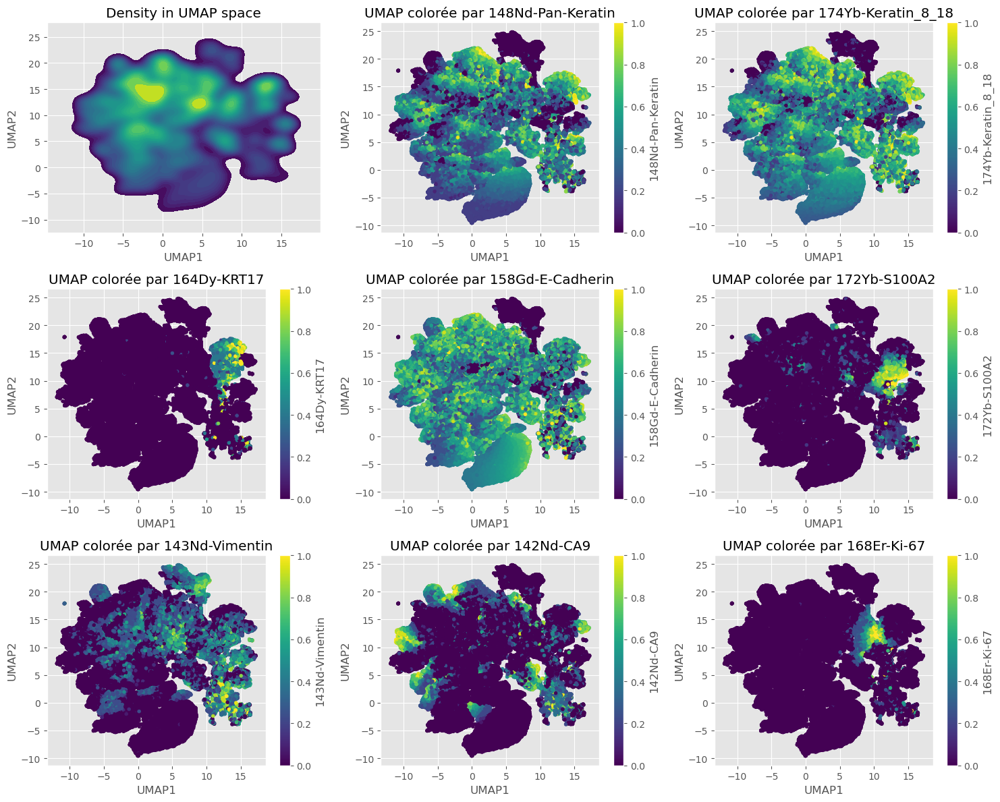

In [60]:
plot_multiple_markers(umap_tumour, tumour_markers + ['168Er-Ki-67'])

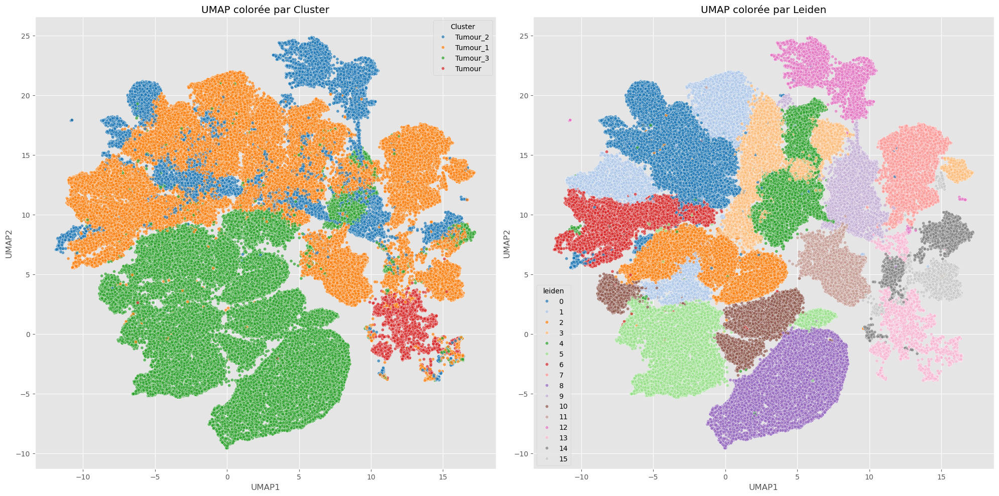

In [61]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

sns.scatterplot(
    data=umap_tumour,
    x="UMAP1",
    y="UMAP2",
    hue="Cluster",
    palette="tab10",
    alpha=0.7,
    s=20,
    ax=axes[0]
)

sns.scatterplot(
    data=umap_tumour,
    x="UMAP1",
    y="UMAP2",
    hue="leiden",
    palette="tab20",
    alpha=0.7,
    s=20,
    ax=axes[1]
)

axes[0].set_title("UMAP colorée par Cluster")
axes[1].set_title("UMAP colorée par Leiden")

plt.tight_layout()
plt.show()

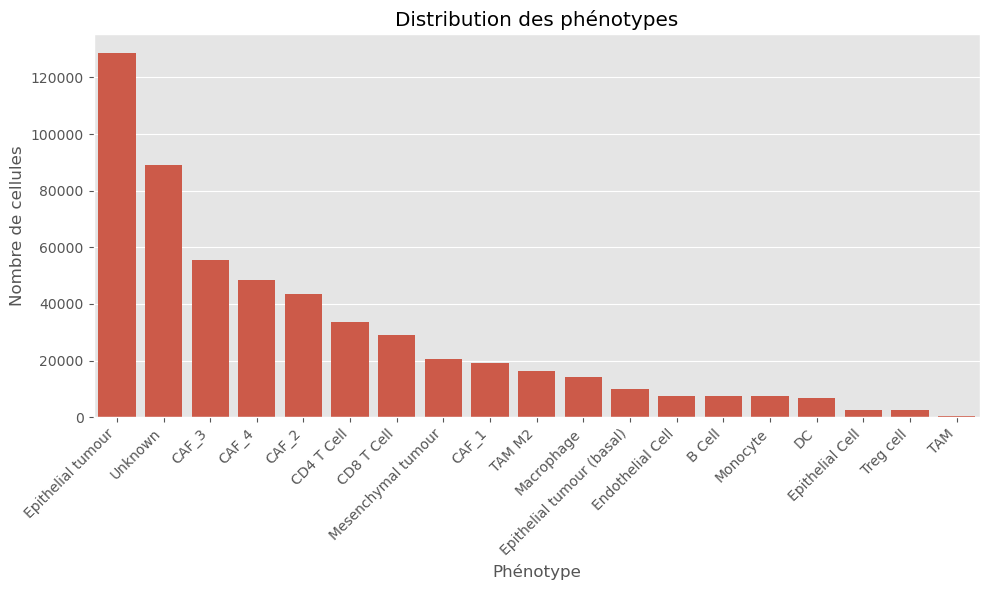

In [62]:
mapping_tumour = {
    "7": "Epithelial tumour (basal)",
}

mapping_cluster_tumor = {
    "Tumour": "Epithelial tumour",
    "Tumour_1": "Epithelial tumour",
    "Tumour_2": "Mesenchymal tumour",
    "Tumour_3": "Epithelial tumour",
}

phenotyped["Cluster"] = phenotyped["Cluster"].replace(mapping_cluster_tumor)

tumour_mask = umap_tumour["leiden"].astype(str).isin(mapping_tumour.keys())

phenotyped.loc[
    umap_tumour.index[tumour_mask],
    "Cluster"
] = umap_tumour.loc[tumour_mask, "leiden"].astype(str).map(mapping_tumour)

plt.figure(figsize=(10, 6))

sns.countplot(
    data=phenotyped,
    x="Cluster",
    order=phenotyped["Cluster"].value_counts().index
)

plt.xticks(rotation=45, ha='right')
plt.title("Distribution des phénotypes")
plt.xlabel("Phénotype")
plt.ylabel("Nombre de cellules")

plt.tight_layout()
plt.show()

### Investigate CAF Cluster

High quantity of CAF and the CAF cluster are not well separated against unknown

In [63]:
relevant_clusters = ['CAF_1','CAF_2','CAF_3','CAF_4']
filtered_df = phenotyped[phenotyped['Cluster'].isin(relevant_clusters)]

umap_CAF = UMAP(filtered_df, identity_markers)

/home/mohamed.tahounza/miniconda3/envs/mosna-GUI/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


KeyboardInterrupt: 

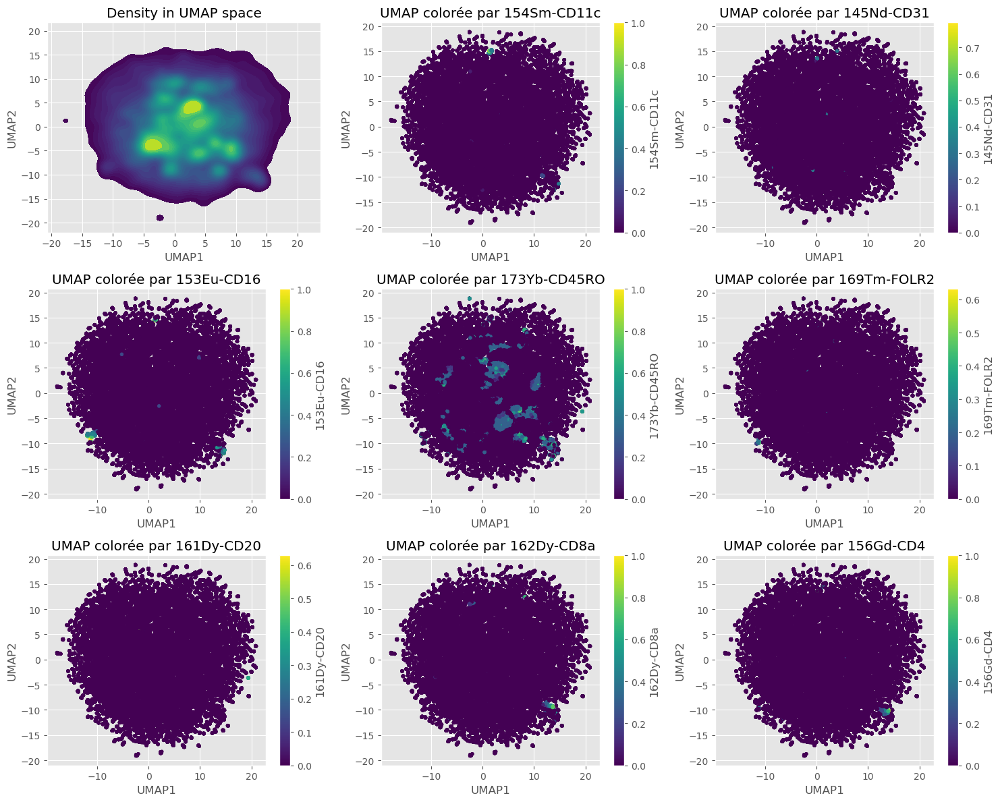

In [ ]:
markers_to_color = ["154Sm-CD11c", '145Nd-CD31', "153Eu-CD16", "173Yb-CD45RO", "169Tm-FOLR2", '161Dy-CD20','162Dy-CD8a','156Gd-CD4']

plot_multiple_markers(umap_CAF, markers_to_color)

In [ ]:
mapping_CAF ={
    "CAF_1":'CAF',
    "CAF_2":'CAF',
    "CAF_3":'CAF',
    "CAF_4":'CAF',
}

phenotyped["Cluster"] = (
    phenotyped["Cluster"]
    .map(mapping_CAF)
    .fillna(phenotyped["Cluster"])
)

### Investigate Unknown Cluster

Le flou reste flou même isolé

In [ ]:
relevant_clusters = ['Unknown']
filtered_df = phenotyped[phenotyped['Cluster'].isin(relevant_clusters)]

umap_unknown = UMAP(filtered_df, identity_markers)

/home/owen.griere/miniconda3/envs/vrac/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/owen.griere/miniconda3/envs/vrac/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:324: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/home/owen.griere/miniconda3/envs/vrac/lib/python3.11/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/owen.griere/miniconda3/envs/vrac/lib/python3.11/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to

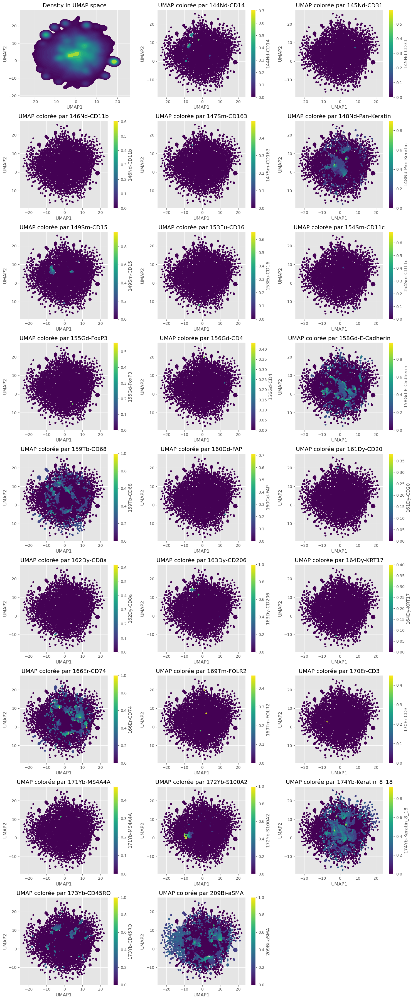

In [ ]:
plot_multiple_markers(umap_unknown, identity_markers)

### Verification

In [ ]:
mask = (
    (phenotyped["location"] == "adjacent normal") &
    (phenotyped["Cluster"] == "Epithelial tumour")
)

phenotyped.loc[mask, "Cluster"] = "Epithelial Cell"

In [ ]:
from matplotlib.colors import TwoSlopeNorm

threshold = 1.0

col_to_keep = identity_markers + ['Cluster'] + functional_markers
mean_expression_reassigned = (
        phenotyped[col_to_keep].groupby("Cluster", as_index=False)
        .mean(numeric_only=True)
    )

mean_expression_reassigned = mean_expression_reassigned.set_index('Cluster')
mean_expression_reassigned = mean_expression_reassigned.apply(lambda col: zscore(col, nan_policy="omit"), axis=0)
mask = mean_expression_reassigned < threshold

plt.figure(figsize=(15, 10))

vmin = np.nanmin(mean_expression_reassigned.values)
vmax = np.nanmax(mean_expression_reassigned.values)
norm = TwoSlopeNorm(vmin=vmin, vcenter=2.0, vmax=vmax)

heatmap = sns.heatmap(mean_expression_reassigned, 
                    mask=mask, annot=False, cmap='RdYlGn',
                    norm=norm, cbar_kws={'label': 'Z-score'})

plt.xlabel('Markers')
plt.ylabel('Clusters')

cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Z-Score', fontsize=24)

plt.title("Z-Scored Marker Values Significant Only", fontsize=30)
plt.xlabel('Markers', fontsize=20)
plt.ylabel('Clusters', fontsize=20)
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.yticks(fontsize=18)
plt.tight_layout()
plt.savefig(folder_saving / "Zscore_heatmap_significant_markers_clusters.png", dpi=300, bbox_inches="tight")
plt.show()

NameError: name 'identity_markers' is not defined

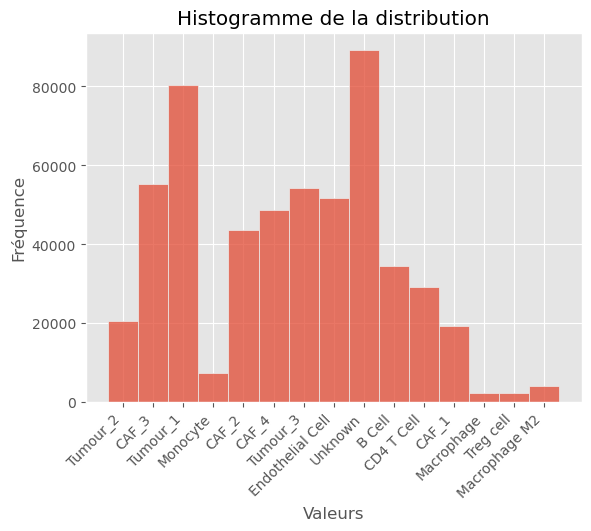

In [ ]:
sns.histplot(phenotyped, x='Cluster' ,bins=30)

plt.title("Histogramme de la distribution")
plt.xlabel("Valeurs")
plt.ylabel("Fréquence")
plt.xticks(rotation=45, ha='right')
plt.show()

### Saving all Nodes files

In [ ]:
SAVING = True

In [ ]:
if SAVING:
    NODE_FOLDER = Path(intermediate_folder) / "nodes_phenotyped"
    NODE_FOLDER.mkdir(exist_ok=True)

    hash = 0
    for file in files:
        
        ### Prepare merged file
        df_merged = pd.DataFrame()
        df_file = pd.read_csv(file)
        name = file.name.split('_')[1]
        df_file['patient'] = name[0:2]
        df_file['sample'] = name[2:4]
        df_file['Object_reindex'] = df_file['Object'] + hash
        df_file = df_file.rename(columns={"Object":"Index", "Object_reindex":'Object'})

        ### Import morpholgy files

        morphology = pd.read_csv(morphology_path / file.name)
        morphology['Object_reindex'] = morphology['Object'] + hash
        morphology = morphology.rename(columns={"Object":"Index", "Object_reindex":'Object'})

        ### Merge Cluster and markers  
        df_merged = pd.merge(
            df_file,
            phenotyped[["patient","Object","sample",'Cluster']],
            on=["patient","Object","sample"],
            how="left"
        )
        df_merged = df_merged.dropna() # remove les cellules invisibles

        ### Merge DF_merged and morphology
        
        df_merged = pd.merge(
            df_merged,
            morphology,
            on=['Object'],
            how="left"
        )
        
        df_merged = df_merged.drop(columns=["Object","patient","sample", 'Index_y'])
        df_merged = df_merged.rename(columns={"Index_x" : "Object", "Cluster":"Phenotype"})

        hash += len(df_file)
        df_merged.to_parquet(NODE_FOLDER / f"nodes_patient-{name[0:2]}_sample-{name[2:4]}.parquet", index=False)

NameError: name 'files' is not defined

In [ ]:
intermediate_folder = Path("./phenograph_clustering")

In [ ]:
if SAVING:
    count_pheno = {}
    count_X = {}
    count_Y = {}
    length = 0
    for file in sorted(NODE_FOLDER.glob('nodes_*.parquet')):
        df = pd.read_parquet(file)
        count_pheno[f'{file.name}'] = df["Phenotype"].isna().sum()
        count_X[f'{file.name}'] = df["centroid-0"].isna().sum()
        count_Y[f'{file.name}'] = df["centroid-1"].isna().sum()
        length += len(df)
    print(count_pheno)
    print(count_X)
    print(count_Y)
    print(length)
    print(len(phenotyped))

NameError: name 'NODE_FOLDER' is not defined

### General UMAP

In [ ]:
print(f'Nombre de cellules présente : {len(phenotyped)}')

Nombre de cellules présente : 543087


In [ ]:
cluster_palette = {
    "CAF_1": "#c7e9c0",
    "CAF_2": "#a1d99b",
    "CAF_3": "#41ab5d",
    "CAF_4": "#006d2c",

    "Tumour":   "#fdd0c0",
    "Tumour_1": "#fc9272",
    "Tumour_2": "#fb6a4a",
    "Tumour_3": "#a50f15",

    "NK Cell": "#e69f00",
    "Endothelial Cell": "#0800ff",
    "CD8 T Cell": "#9467bd",
    "CD4 T Cell": "#FF00E1",
    "Macrophage": "#8c564b",
    "Macrophage M2": "#7f7f7f",
    "Treg cell": "#e377c2",
    "B Cell": "#1f77b4",
}

In [ ]:
UMAP_data = phenotyped[phenotyped['Cluster'] != 'Unknown'].copy()
UMAP_data = UMAP_data[UMAP_data['Cluster'] != 'CAF'].copy()

X = UMAP_data[functional_markers + identity_markers].fillna(0).values
X_scaled = StandardScaler().fit_transform(X)

adata = ad.AnnData(X_scaled)
adata.obs["Cluster"] = UMAP_data["Cluster"].values

sc.pp.neighbors(adata, n_neighbors=15, use_rep="X")
sc.tl.leiden(adata, resolution=0.1)
sc.tl.umap(adata)

UMAP_data["UMAP1"] = adata.obsm["X_umap"][:, 0]
UMAP_data["UMAP2"] = adata.obsm["X_umap"][:, 1]
UMAP_data["leiden"] = adata.obs["leiden"].values

NameError: name 'functional_markers' is not defined

In [ ]:
palette_20 = [
    "#e6194b",  
    "#3cb44b", 
    "#ffe119",  
    "#4363d8",  
    "#f58231", 
    "#911eb4", 
    "#46f0f0",  
    "#f032e6", 
    "#bcf60c",  
    "#008080",  
    "#e6beff",  
    "#800000", 
    "#aaffc3",
    "#808000",  
    "#ffd8b1",  
    "#000075",   
]

/tmp/ipykernel_183055/100046808.py:2: UserWarning: The palette list has more values (16) than needed (14), which may not be intended.
  sns.scatterplot(


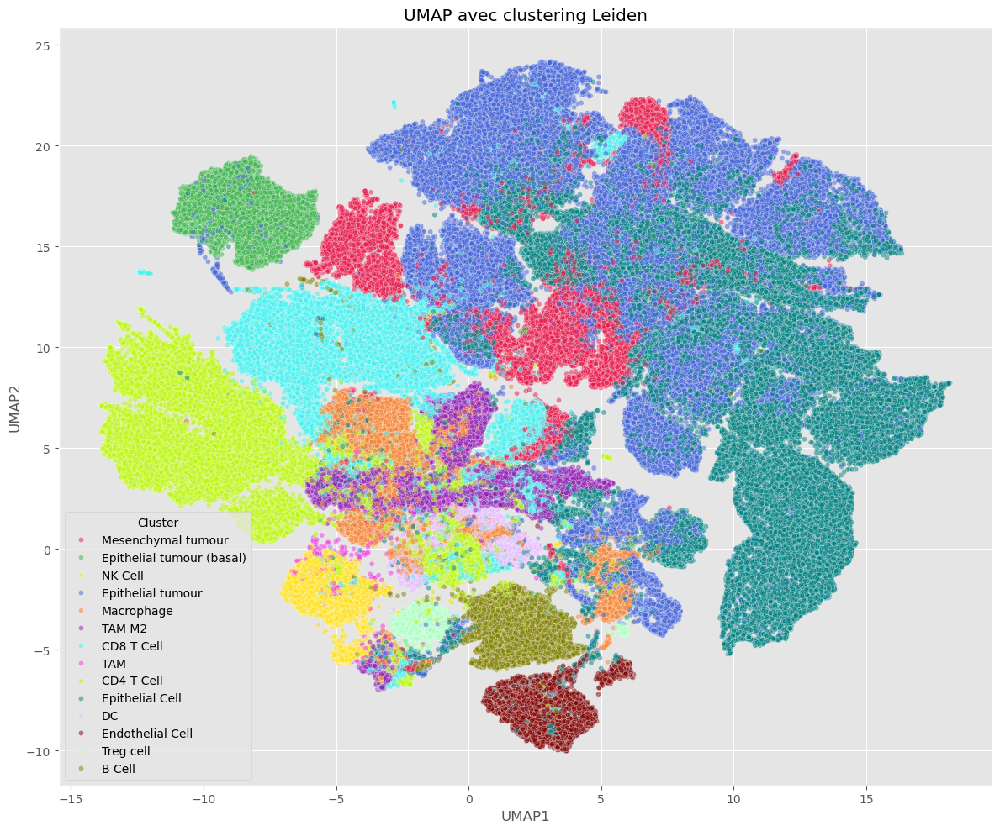

In [ ]:
plt.figure(figsize=(12, 10))
sns.scatterplot(
    data=UMAP_data,
    x="UMAP1",
    y="UMAP2",
    hue="Cluster",
    palette=palette_20,
    alpha=0.5,
    s=20
)
plt.title("UMAP avec clustering Leiden")
plt.tight_layout()
plt.show()

In [ ]:
tab30 = (
    list(plt.get_cmap("tab20").colors) +
    list(plt.get_cmap("tab20b").colors) +
    list(plt.get_cmap("tab20c").colors)[:10]
)

plt.figure(figsize=(12, 10))
sns.scatterplot(
    data=UMAP_data,
    x="UMAP1",
    y="UMAP2",
    hue="leiden",
    palette=tab30,
    alpha=0.5,
    s=20
)
plt.title("UMAP avec clustering Leiden")
plt.tight_layout()
plt.show()

/tmp/ipykernel_183055/935037885.py:8: UserWarning: The palette list has more values (50) than needed (21), which may not be intended.
  sns.scatterplot(
